###### Tutorial | Predicting phonon DoS with `e3nn`
#### For Colab only:
*   Go to Runtime > Change runtime type, and select GPU.
*   Clone the GitHub repository to access the tutorial files:

In [1]:
# !git clone https://github.com/ninarina12/phononDoS_tutorial.git
# %cd phononDoS_tutorial

*   Install some relevant packages (should take < 1 minute).

In [2]:
# !pip install ase e3nn
# !pip install torch-scatter torch-cluster torch-sparse torch-spline-conv -f https://pytorch-geometric.com/whl/torch-$(python -c "import torch; print(torch.__version__)").html
# !pip install torch-geometric
# pip install periodictable

### Getting started

In [3]:
# model
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch_geometric as tg
import torch_scatter
import e3nn
from e3nn import o3
from typing import Dict, Union

# crystal structure data
from ase import Atom, Atoms
from ase.neighborlist import neighbor_list
from ase.visualize.plot import plot_atoms

# data pre-processing and visualization
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# utilities
import time
from tqdm import tqdm
from utils.utils_data import (load_data, train_valid_test_split, plot_example, plot_predictions, plot_partials,
                              palette, colors, cmap)
from utils.utils_model import Network, visualize_layers, train
from utils.utils_plot import plotly_surface, plot_orbitals, get_middle_feats

bar_format = '{l_bar}{bar:10}{r_bar}{bar:-10b}'
default_dtype = torch.float64
torch.set_default_dtype(default_dtype)

### Data provenance
We train our model using the database of Density Functional Perturbation Theory (DFPT)-calculated phonon densities of states (DoS), containing approximately 1,500 crystalline solids [[Petretto et al. 2018]](https://doi.org/10.1038/sdata.2018.65).

In [4]:
# load data
df, species = load_data('data/data.csv')
df.head()

100%|██████████| 1539/1539 [00:00<00:00, 78769.88it/s]                          


,mp_id,structure,phfreq,phdos,pdos,formula,species
0,mp-1000,"(Atom('Ba', [0.0, 0.0, 0.0], index=0), Atom('T...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 0.1603814665137704, 0.366293016390463, 0...","{'Ba': [0.0, 0.17004785173719497, 0.4321591874...",BaTe,"[Ba, Te]"
1,mp-1002124,"(Atom('Hf', [0.0, 0.0, 0.0], index=0), Atom('C...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.02337731725373556, 0.030910686260937723, 0....","{'Hf': [0.026541048236378005, 0.03587084551615...",CHf,"[Hf, C]"
2,mp-1002164,"(Atom('Ge', [0.0, 0.0, 0.0], index=0), Atom('C...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 0.0017221473876927959, 0.005981246148731...","{'Ge': [0.0, 0.00316167053214679, 0.0109190651...",CGe,"[Ge, C]"
3,mp-10044,"(Atom('B', [4.440892098500626e-16, 6.194849927...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 0.002277293012378372, 0.0078646582782471...","{'B': [0.0, 0.00029269193672558846, 0.00105324...",AsB,"[B, As]"
4,mp-1008223,"(Atom('Ca', [0.0, 0.0, 0.0], index=0), Atom('S...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 0.258870972416879, 0.5505201512544314, 0...","{'Ca': [0.0, 0.11150000312651394, 0.2215562000...",CaSe,"[Ca, Se]"


In [5]:
df.head().T

,0,1,2,3,4
mp_id,mp-1000,mp-1002124,mp-1002164,mp-10044,mp-1008223
structure,"(Atom('Ba', [0.0, 0.0, 0.0], index=0), Atom('T...","(Atom('Hf', [0.0, 0.0, 0.0], index=0), Atom('C...","(Atom('Ge', [0.0, 0.0, 0.0], index=0), Atom('C...","(Atom('B', [4.440892098500626e-16, 6.194849927...","(Atom('Ca', [0.0, 0.0, 0.0], index=0), Atom('S..."
phfreq,"[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14..."
phdos,"[0.0, 0.1603814665137704, 0.366293016390463, 0...","[0.02337731725373556, 0.030910686260937723, 0....","[0.0, 0.0017221473876927959, 0.005981246148731...","[0.0, 0.002277293012378372, 0.0078646582782471...","[0.0, 0.258870972416879, 0.5505201512544314, 0..."
pdos,"{'Ba': [0.0, 0.17004785173719497, 0.4321591874...","{'Hf': [0.026541048236378005, 0.03587084551615...","{'Ge': [0.0, 0.00316167053214679, 0.0109190651...","{'B': [0.0, 0.00029269193672558846, 0.00105324...","{'Ca': [0.0, 0.11150000312651394, 0.2215562000..."
formula,BaTe,CHf,CGe,AsB,CaSe
species,"[Ba, Te]","[Hf, C]","[Ge, C]","[B, As]","[Ca, Se]"


In [62]:
from ase import Atoms
import pandas as pd
atoms = df.structure[1525]
cell_matrix = atoms.cell
cell_df = pd.DataFrame(cell_matrix, columns=['A', 'B', 'C'])
cell_df


,A,B,C
0,-2.947493,5.107810,-0.000546
1,0.003067,0.000458,11.420514
2,5.894639,-0.000191,0.001512


### Data structures
Crystal structures are represented as [ASE](https://wiki.fysik.dtu.dk/ase/ase/atoms.html?highlight=atoms#the-atoms-object) (Atomic Simulation Environment) `Atoms` objects, which store the atomic species and positions of each atom in the unit cell, as well as the lattice vectors of the unit cell.

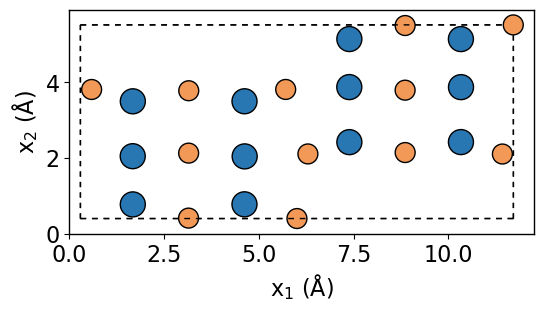

In [61]:
# plot an example structure
i = 1525 # structure index in dataframe


struct = df.iloc[i]['structure']
symbols = np.unique(list(struct.symbols))
z = dict(zip(symbols, range(len(symbols))))

fig, ax = plt.subplots(figsize=(6,5))
norm = plt.Normalize(vmin=0, vmax=len(symbols)-1)
color = [mpl.colors.to_hex(k) for k in cmap(norm([z[j] for j in list(struct.symbols)]))]
plot_atoms(struct, ax, radii=0.25, colors=color, rotation=('0x,90y,0z'))

ax.set_xlabel(r'$x_1\ (\AA)$')
ax.set_ylabel(r'$x_2\ (\AA)$');

average lattice parameter (a/b/c): 4.928500467883206 / 5.294429384240685 / 6.558512237261923


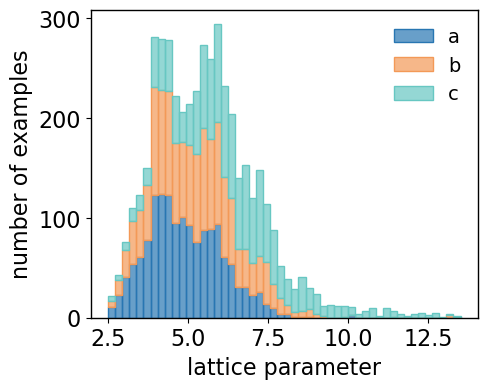

In [8]:
# lattice parameter statistics
def get_lattice_parameters(df):
    a = []
    for entry in df.itertuples():
        a.append(entry.structure.cell.cellpar()[:3])
    return np.stack(a)

a = get_lattice_parameters(df)

fig, ax = plt.subplots(1,1, figsize=(5,4))
b = 0.
bins = 50
for d, c, n in zip(['a', 'b', 'c'], colors.values(), [a[:,0], a[:,1], a[:,2]]):
    color = [int(c.lstrip('#')[i:i+2], 16)/255. for i in (0,2,4)]
    y, bins, _, = ax.hist(n, bins=bins, fc=color+[0.7], ec=color, bottom=b, label=d)
    b += y
ax.set_xlabel('lattice parameter')
ax.set_ylabel('number of examples')
ax.legend(frameon=False)

print('average lattice parameter (a/b/c):', a[:,0].mean(), '/', a[:,1].mean(), '/', a[:,2].mean())

### Feature representation
We construct the inputs to our neural network following the `e3nn` [Documentation](https://docs.e3nn.org/en/latest/guide/periodic_boundary_conditions.html) on handling point inputs with periodic boundary conditions. For a given crystal, each atom in the unit cell is associated with a feature vector that one-hot encodes its atomic mass in the index corresponding to its atomic number. The unit cell of the crystal is encoded as a graph in which two atoms (nodes) are joined by an edge if they are within a cutoff radius `r_max` of one another.

In [9]:
# one-hot encoding atom type and mass
type_encoding = {}
specie_am = []
for Z in tqdm(range(1, 119), bar_format=bar_format):
    specie = Atom(Z)
    type_encoding[specie.symbol] = Z - 1
    specie_am.append(specie.mass)

type_onehot = torch.eye(len(type_encoding))
am_onehot = torch.diag(torch.tensor(specie_am))

100%|██████████| 118/118 [00:00<00:00, 202756.20it/s]                           


In [10]:
# build data
def build_data(entry, type_encoding, type_onehot, r_max=5.):
    symbols = list(entry.structure.symbols).copy()
    positions = torch.from_numpy(entry.structure.positions.copy())
    lattice = torch.from_numpy(entry.structure.cell.array.copy()).unsqueeze(0)

    # edge_src and edge_dst are the indices of the central and neighboring atom, respectively
    # edge_shift indicates whether the neighbors are in different images or copies of the unit cell
    edge_src, edge_dst, edge_shift = neighbor_list("ijS", a=entry.structure, cutoff=r_max, self_interaction=True)
    
    # compute the relative distances and unit cell shifts from periodic boundaries
    edge_batch = positions.new_zeros(positions.shape[0], dtype=torch.long)[torch.from_numpy(edge_src)]
    edge_vec = (positions[torch.from_numpy(edge_dst)]
                - positions[torch.from_numpy(edge_src)]
                + torch.einsum('ni,nij->nj', torch.tensor(edge_shift, dtype=default_dtype), lattice[edge_batch]))

    # compute edge lengths (rounded only for plotting purposes)
    edge_len = np.around(edge_vec.norm(dim=1).numpy(), decimals=2)
    
    data = tg.data.Data(
        pos=positions, lattice=lattice, symbol=symbols,
        x=am_onehot[[type_encoding[specie] for specie in symbols]],   # atomic mass (node feature)
        z=type_onehot[[type_encoding[specie] for specie in symbols]], # atom type (node attribute)
        edge_index=torch.stack([torch.LongTensor(edge_src), torch.LongTensor(edge_dst)], dim=0),
        edge_shift=torch.tensor(edge_shift, dtype=default_dtype),
        edge_vec=edge_vec, edge_len=edge_len,
        phdos=torch.from_numpy(entry.phdos).unsqueeze(0)
    )
    
    return data

r_max = 4. # cutoff radius
df['data'] = df.progress_apply(lambda x: build_data(x, type_encoding, type_onehot, r_max), axis=1)

100%|██████████| 1539/1539 [00:14<00:00, 105.00it/s]                            


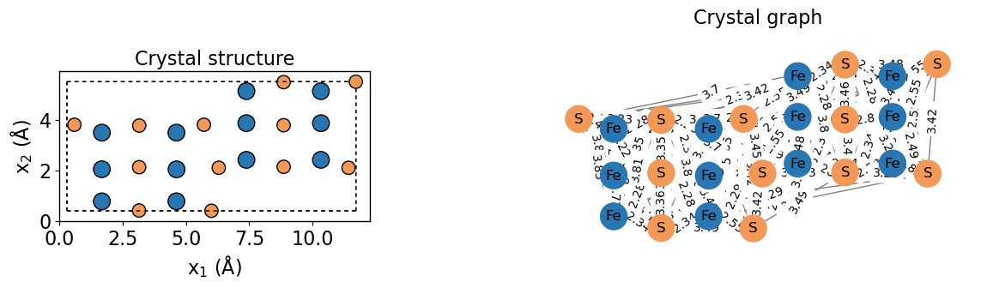

In [60]:
i = 1525  # structure index in dataframe
plot_example(df, i=i, label_edges=True)

### Training, validation, and testing datasets
Split the data into training, validation, and testing datasets with balanced representation of different elements in each set.

split train/dev ...


100%|██████████| 64/64 [00:00<00:00, 631.90it/s]                                


split valid/test ...


100%|██████████| 62/62 [00:00<00:00, 1155.08it/s]                               

number of training examples: 1200
number of validation examples: 148
number of testing examples: 191
total number of examples: 1539


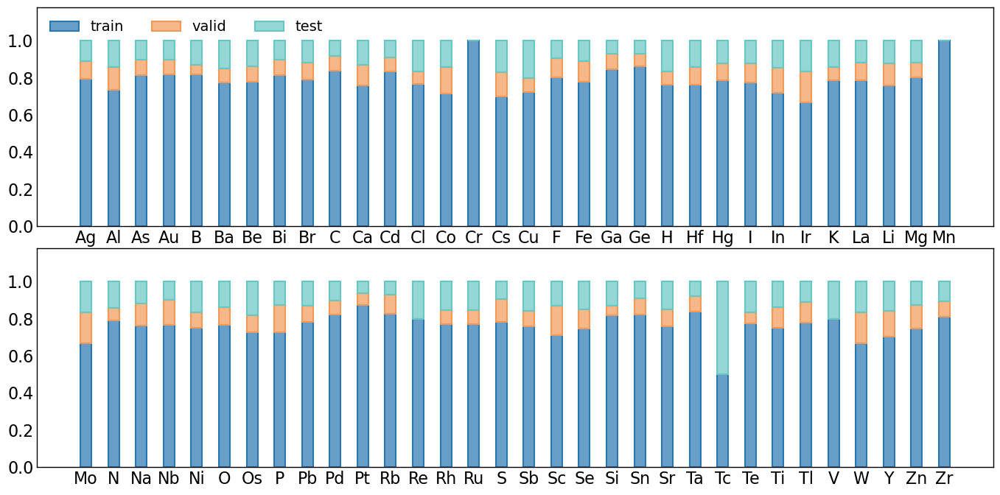

In [12]:
# train/valid/test split
idx_train, idx_valid, idx_test = train_valid_test_split(df, species, valid_size=.1, test_size=.1, seed=12, plot=True)

For use with the trained model provided, the indices of the training, validation, and test sets are loaded below. These indices were generated with a specific seed using the above `train_valid_test_split` function.

In [13]:
# Load train/valid/test indices
def load_indices(file_path):
    with open(file_path, 'r') as f:
        indices = [int(line.strip()) for line in f.readlines() if line.strip()]
    return indices

idx_train = load_indices('data/idx_train.txt')
idx_valid = load_indices('data/idx_valid.txt')
idx_test = load_indices('data/idx_test.txt')

# Format dataloaders
batch_size = 1
dataloader_train = tg.loader.DataLoader(df.iloc[idx_train]['data'].values, batch_size=batch_size, shuffle=True)
dataloader_valid = tg.loader.DataLoader(df.iloc[idx_valid]['data'].values, batch_size=batch_size)
dataloader_test = tg.loader.DataLoader(df.iloc[idx_test]['data'].values, batch_size=batch_size)


average number of neighbors (train/valid/test): 15.694702602230484 / 20.763157894736842 / 54.89421487603306


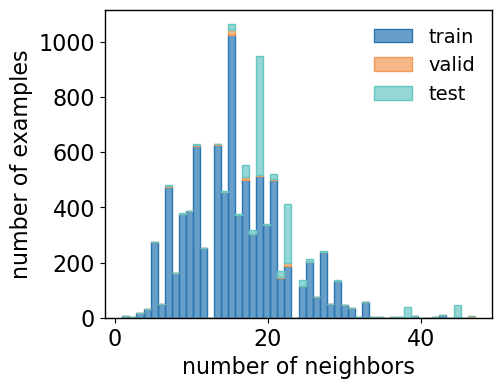

In [14]:
# calculate average number of neighbors
def get_neighbors(df, idx):
    n = []
    for entry in df.iloc[idx].itertuples():
        N = entry.data.pos.shape[0]
        for i in range(N):
            n.append(len((entry.data.edge_index[0] == i).nonzero()))
    return np.array(n)

n_train = get_neighbors(df, idx_train)
n_valid = get_neighbors(df, idx_valid)
n_test = get_neighbors(df, idx_test)

fig, ax = plt.subplots(1,1, figsize=(5,4))
b = 0.
bins = 50
for (d, c), n in zip(colors.items(), [n_train, n_valid, n_test]):
    color = [int(c.lstrip('#')[i:i+2], 16)/255. for i in (0,2,4)]
    y, bins, _, = ax.hist(n, bins=bins, fc=color+[0.7], ec=color, bottom=b, label=d)
    b += y
ax.set_xlabel('number of neighbors')
ax.set_ylabel('number of examples')
ax.legend(frameon=False)

print('average number of neighbors (train/valid/test):', n_train.mean(), '/', n_valid.mean(), '/', n_test.mean())

### Network architecture
We build a model based on the `Network` described in the `e3nn` [Documentation](https://docs.e3nn.org/en/latest/api/nn/models/gate_points_2101.html), modified to incorporate the periodic boundaries we imposed on the crystal graphs. The network applies equivariant convolutions to each atomic node and finally takes an average over all nodes, normalizing the output.

In [15]:
class PeriodicNetwork(Network):
    def __init__(self, in_dim, em_dim, **kwargs):            
        # override the `reduce_output` keyword to instead perform an averge over atom contributions    
        self.pool = False
        if kwargs['reduce_output'] == True:
            kwargs['reduce_output'] = False
            self.pool = True
            
        super().__init__(**kwargs)

        # embed the mass-weighted one-hot encoding
        self.em = nn.Linear(in_dim, em_dim)

    def forward(self, data: Union[tg.data.Data, Dict[str, torch.Tensor]]) -> torch.Tensor:
        data.x = F.relu(self.em(data.x))
        data.z = F.relu(self.em(data.z))
        output = super().forward(data)
        output = torch.relu(output)
        
        # if pool_nodes was set to True, use scatter_mean to aggregate
        if self.pool == True:
            output = torch_scatter.scatter_mean(output, data.batch, dim=0)  # take mean over atoms per example
        
        maxima, _ = torch.max(output, dim=1)
        output = output.div(maxima.unsqueeze(1))
        
        return output

In [16]:
out_dim = len(df.iloc[0]['phfreq'])
em_dim = 64  

model = PeriodicNetwork(
    in_dim=118,                            # dimension of one-hot encoding of atom type
    em_dim=em_dim,                         # dimension of atom-type embedding
    irreps_in=str(em_dim)+"x0e",           # em_dim scalars (L=0 and even parity) on each atom to represent atom type
    irreps_out=str(out_dim)+"x0e",         # out_dim scalars (L=0 and even parity) to output
    irreps_node_attr=str(em_dim)+"x0e",    # em_dim scalars (L=0 and even parity) on each atom to represent atom type
    layers=2,                              # number of nonlinearities (number of convolutions = layers + 1)
    mul=32,                                # multiplicity of irreducible representations
    lmax=1,                                # maximum order of spherical harmonics
    max_radius=r_max,                      # cutoff radius for convolution
    num_neighbors=n_train.mean(),          # scaling factor based on the typical number of neighbors
    reduce_output=True                     # whether or not to aggregate features of all atoms at the end
)

print(model)

/Users/nitadwifitriani/anaconda3/lib/python3.11/site-packages/torch/jit/_check.py:172: UserWarning: The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.
  warnings.warn("The TorchScript type system doesn't support "


PeriodicNetwork(
  (layers): ModuleList(
    (0): CustomCompose(
      (first): Convolution(
        (sc): FullyConnectedTensorProduct(64x0e x 64x0e -> 64x0e+32x1o | 262144 paths | 262144 weights)
        (lin1): FullyConnectedTensorProduct(64x0e x 64x0e -> 64x0e | 262144 paths | 262144 weights)
        (fc): FullyConnectedNet[10, 100, 128]
        (tp): TensorProduct(64x0e x 1x0e+1x1o -> 64x0e+64x1o | 128 paths | 128 weights)
        (lin2): FullyConnectedTensorProduct(64x0e+64x1o x 64x0e -> 64x0e+32x1o | 393216 paths | 393216 weights)
      )
      (second): Gate (64x0e+32x1o -> 32x0e+32x1o)
    )
    (1): CustomCompose(
      (first): Convolution(
        (sc): FullyConnectedTensorProduct(32x0e+32x1o x 64x0e -> 96x0e+32x1o+32x1e | 262144 paths | 262144 weights)
        (lin1): FullyConnectedTensorProduct(32x0e+32x1o x 64x0e -> 32x0e+32x1o | 131072 paths | 131072 weights)
        (fc): FullyConnectedNet[10, 100, 160]
        (tp): TensorProduct(32x0e+32x1o x 1x0e+1x1o -> 64x0e+64x1o+

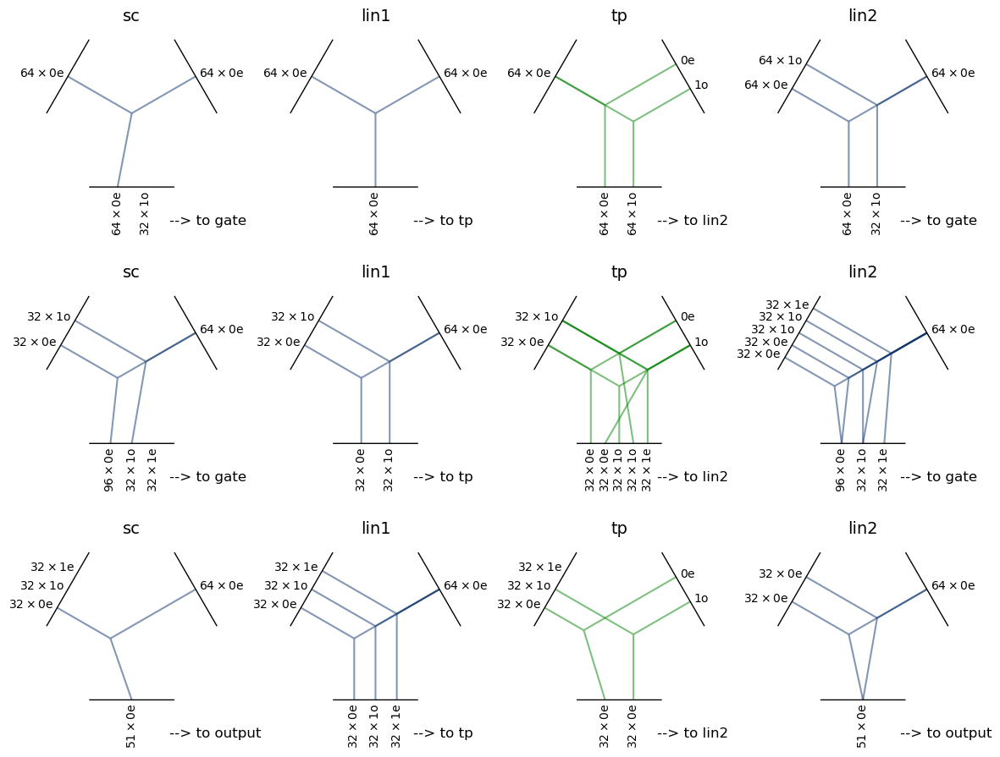

In [17]:
# visualize tensor products of the model
visualize_layers(model)

### Training
The model is trained using a mean-squared error loss function with an Adam optimizer.

In [18]:
opt = torch.optim.AdamW(model.parameters(), lr=0.005, weight_decay=0.05)
scheduler = torch.optim.lr_scheduler.ExponentialLR(opt, gamma=0.96)

loss_fn = torch.nn.MSELoss()
loss_fn_mae = torch.nn.L1Loss()

In [19]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print('torch device:' , device)

run_name = 'model_' + time.strftime("%y%m%d", time.localtime())
print(run_name)

torch device: cpu
model_240321


In [20]:
model.pool = True
train(model, opt, dataloader_train, dataloader_valid, loss_fn, loss_fn_mae, run_name,
      max_iter=1, scheduler=scheduler, device=device)

100%|██████████| 1183/1183 [00:35<00:00, 33.52it/s]                             


Iteration    1   train loss =   0.0346   valid loss =   0.0497   elapsed time = 00:00:35


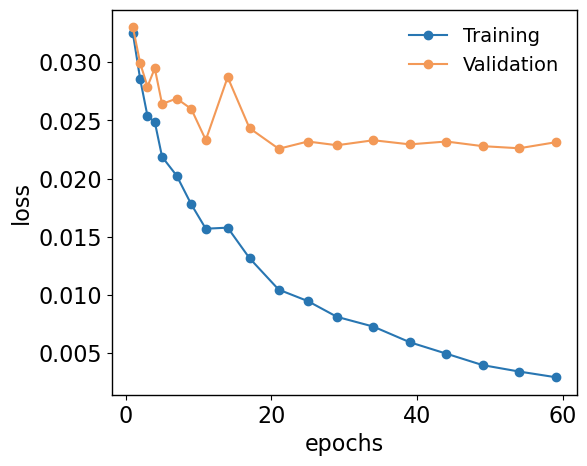

In [21]:
# load pre-trained model and plot its training history
run_name = 'model'

history = torch.load(run_name + '.torch', map_location=device)['history']
steps = [d['step'] + 1 for d in history]
loss_train = [d['train']['loss'] for d in history]
loss_valid = [d['valid']['loss'] for d in history]

fig, ax = plt.subplots(figsize=(6,5))
ax.plot(steps, loss_train, 'o-', label="Training", color=colors['train'])
ax.plot(steps, loss_valid, 'o-', label="Validation", color=colors['valid'])
ax.set_xlabel('epochs')
ax.set_ylabel('loss')
ax.legend(frameon=False);

### Results
We evaluate our model by visualizing the predicted and true DoS in each error quartile. We further compare the hidden features learned for each node to the partial DoS.

In [22]:
# predict on all data
model.load_state_dict(torch.load(run_name + '.torch', map_location=device)['state'])
model.pool = True

dataloader = tg.loader.DataLoader(df['data'].values, batch_size=64)
df['mse'] = 0.
df['phdos_pred'] = np.empty((len(df), 0)).tolist()

model.to(device)
model.eval()
with torch.no_grad():
    i0 = 0
    for i, d in tqdm(enumerate(dataloader), total=len(dataloader), bar_format=bar_format):
        d.to(device)
        output = model(d)
        loss = F.mse_loss(output, d.phdos, reduction='none').mean(dim=-1).cpu().numpy()
        df.loc[i0:i0 + len(d.phdos) - 1, 'phdos_pred'] = [[k] for k in output.cpu().numpy()]
        df.loc[i0:i0 + len(d.phdos) - 1, 'mse'] = loss
        i0 += len(d.phdos)
        
df['phdos_pred'] = df['phdos_pred'].map(lambda x: x[0])
# df.phdos_pred[1522]

100%|██████████| 25/25 [00:02<00:00,  9.76it/s]                                 


In [23]:
df.phdos_pred[1525]

array([5.12213530e-03, 5.76926355e-04, 1.04737188e-01, 5.71669043e-02,
       2.80901375e-01, 3.48006729e-01, 6.31164544e-01, 6.82232196e-01,
       5.70435475e-01, 8.18606336e-01, 8.09003388e-01, 6.48800789e-01,
       7.13955539e-01, 5.46087854e-01, 7.16863529e-01, 8.49382058e-01,
       1.00000000e+00, 8.84497316e-01, 4.77019606e-01, 6.27653366e-01,
       5.60804715e-01, 4.57806957e-01, 3.79588323e-01, 3.10522882e-01,
       1.43689214e-01, 3.73482925e-02, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.50678895e-02,
       0.00000000e+00, 5.42141840e-03, 0.00000000e+00, 3.13050780e-02,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 3.94575358e-03,
       3.48264541e-03, 0.00000000e+00, 4.92530470e-03])

In [24]:
df.phdos_pred[1524]

array([0.00000000e+00, 0.00000000e+00, 1.17271861e-01, 3.97238588e-01,
       3.82513981e-01, 1.20025515e-01, 2.38995620e-01, 2.86125588e-01,
       3.07939576e-01, 6.76918732e-01, 5.82005644e-01, 5.15830015e-01,
       5.46732199e-01, 5.52013984e-01, 6.73954380e-01, 9.50039337e-01,
       1.00000000e+00, 7.46518638e-01, 3.18252020e-01, 5.67699350e-01,
       4.02321481e-01, 4.78185604e-01, 3.57443814e-01, 3.80451116e-01,
       2.80349434e-01, 2.71563302e-01, 1.04810633e-01, 9.01472245e-02,
       6.72655255e-02, 1.33466981e-02, 3.07178084e-02, 9.51205143e-02,
       0.00000000e+00, 3.73080124e-02, 1.25474819e-01, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 8.39528912e-03, 1.23552566e-01, 0.00000000e+00,
       1.05471687e-02, 0.00000000e+00, 1.44855967e-04, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

In [25]:
df.formula[1529]

'Fe128S256'

In [26]:
idx_valid,idx_test

([1, 222, 283, 285, 434, 521, 873, 979, 1332, 1359, 1378, 1381, 1383],
 [1,
  222,
  283,
  285,
  434,
  521,
  873,
  979,
  1332,
  1359,
  1378,
  1381,
  1522,
  1523,
  1524,
  1525,
  1526,
  1527,
  1528,
  1529,
  1530,
  1531,
  1532,
  1533,
  1534,
  1535,
  1536,
  1537,
  1538,
  1383])

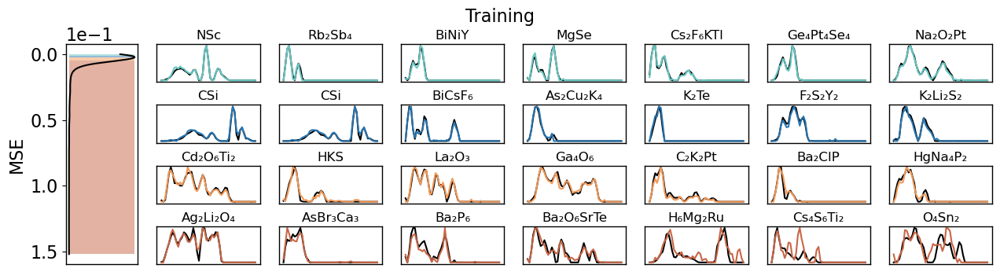

In [27]:
plot_predictions(df, idx_train, 'Training')

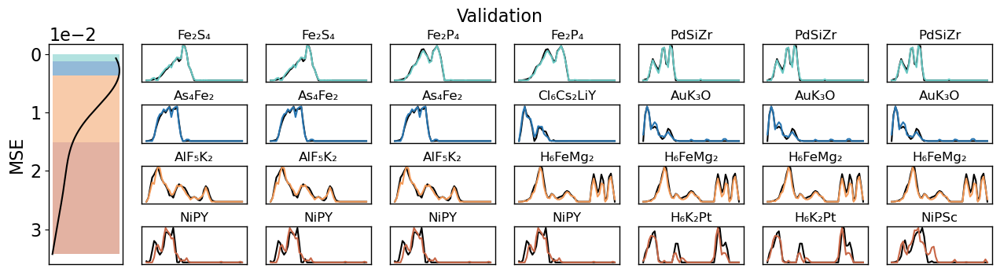

In [28]:
plot_predictions(df, idx_valid, 'Validation')

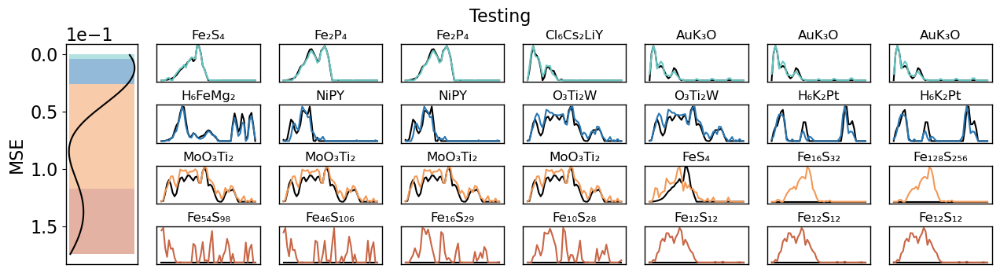

In [29]:
plot_predictions(df, idx_test, 'Testing')

In [57]:
import pandas as pd

# Assuming df is your DataFrame
# You can replace "formula" with the actual column name in your DataFrame
filtered_df = df[df['formula'].str.contains('Fe', case=False, na=False)]

# Count the occurrences
count_fe = filtered_df.shape[0]

# Display the filtered DataFrame and count
print("Filtered DataFrame:")
print(filtered_df)

print("\nNumber of occurrences of 'Fe':", count_fe)


Filtered DataFrame:
           mp_id                                          structure  \
222      mp-1522  (Atom('Fe', [1.6717397749999998, 2.18311303, 2...   
283     mp-20027  (Atom('Fe', [1.34227587, 0.0, 2.78946947], ind...   
285      mp-2008  (Atom('Fe', [0.0, 0.0, 0.0], index=0), Atom('F...   
434     mp-23804  (Atom('Mg', [6.661338147750939e-16, 8.24406520...   
520     mp-27904  (Atom('Fe', [-0.10878064958060976, -3.82893342...   
872    mp-567636  (Atom('V', [0.0, 0.0, 0.0], index=0), Atom('Fe...   
978    mp-643264  (Atom('Ba', [0.0, 0.0, -3.433374515], index=0)...   
1121      mp-760  (Atom('Fe', [0.0, 0.0, 0.0], index=0), Atom('F...   
1269   mp-866141  (Atom('Ti', [0.0, 0.0, 0.0], index=0), Atom('F...   
1331     mp-9198  (Atom('Fe', [0.0054297389817614585, -0.0121308...   
1358     mp-9437  (Atom('Nb', [0.0, 0.0, 0.0], index=0), Atom('F...   
1377   mp-961649  (Atom('Zr', [2.220446049250313e-16, 5.21057874...   
1380   mp-961660  (Atom('Ti', [0.0, 4.793474793921328, 2.

Formula: NiPSc


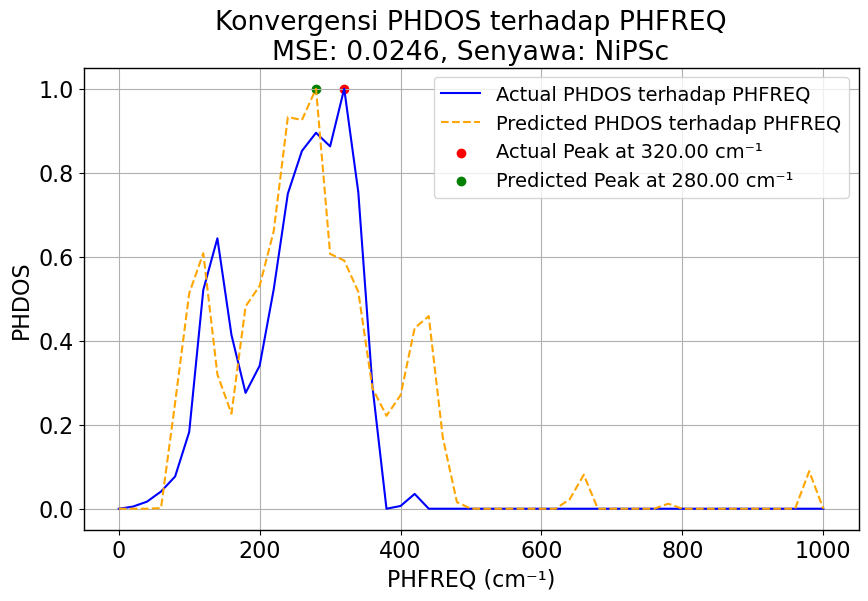

In [31]:
from matplotlib import pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance
import periodictable

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[1383]
phfreq_data = df.phfreq[1383]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1383]
phfreq_pred_data = df.phfreq[1383]
formula = df.formula[1383]

print("Formula:", formula)  # Debugging line

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label=f'Actual PHDOS terhadap PHFREQ', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label='Predicted PHDOS terhadap PHFREQ', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')

# Mendapatkan nama senyawa dari rumus kimia
compound = Substance.from_formula(formula).unicode_name

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}, Senyawa: {compound}')
plt.legend()
plt.grid(True)
plt.show()


Formula: O4Ti2


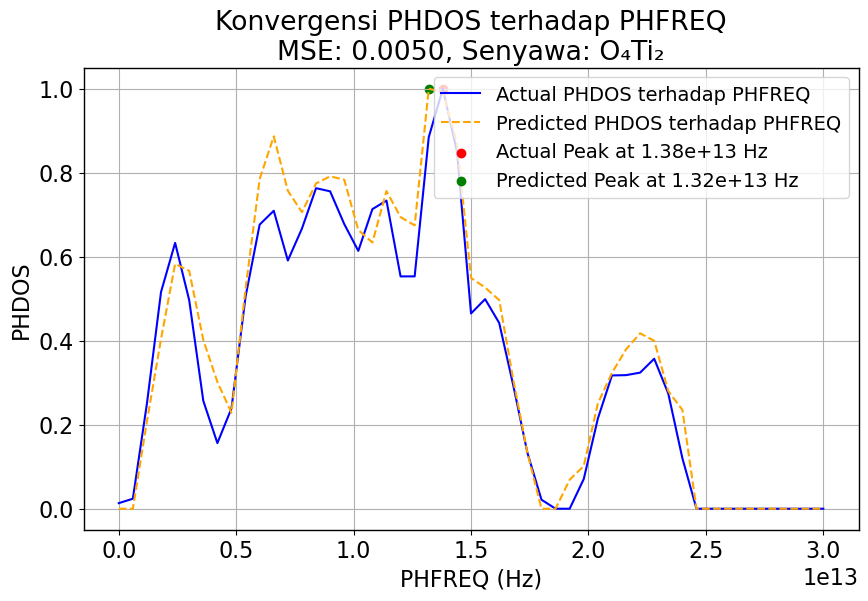

In [32]:
from matplotlib import pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance
import periodictable

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[1538]
phfreq_data = df.phfreq[1538]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1538]
phfreq_pred_data = df.phfreq[1538]
formula = df.formula[1538]

print("Formula:", formula)  # Debugging line

# Mengonversi frekuensi dari cm⁻¹ menjadi Hz
phfreq_data_hz = phfreq_data * 3 * 10**10  # Kecepatan cahaya dalam cm/s adalah 3 * 10^10 cm/s
phfreq_pred_data_hz = phfreq_pred_data * 3 * 10**10

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data_hz, phdos_data, label=f'Actual PHDOS terhadap PHFREQ', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data_hz, phdos_pred_data, label='Predicted PHDOS terhadap PHFREQ', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data_hz[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2e} Hz')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data_hz[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2e} Hz')

# Mendapatkan nama senyawa dari rumus kimia
compound = Substance.from_formula(formula).unicode_name

plt.xlabel('PHFREQ (Hz)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}, Senyawa: {compound}')
plt.legend()
plt.grid(True)
plt.show()


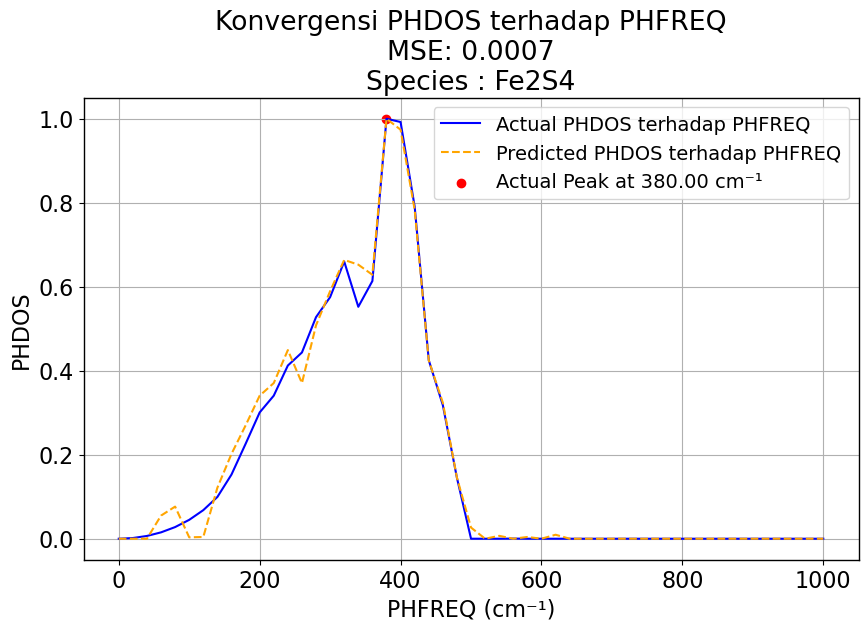

In [33]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[222]
phfreq_pred_data = df.phfreq[222]
formula = df.formula[222]

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label=f'Actual PHDOS terhadap PHFREQ', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label='Predicted PHDOS terhadap PHFREQ', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# # Tandai titik puncak pada grafik data prediksi
# plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')


plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}'f'\nSpecies : {formula}')
plt.legend()
plt.grid(True)
plt.show()


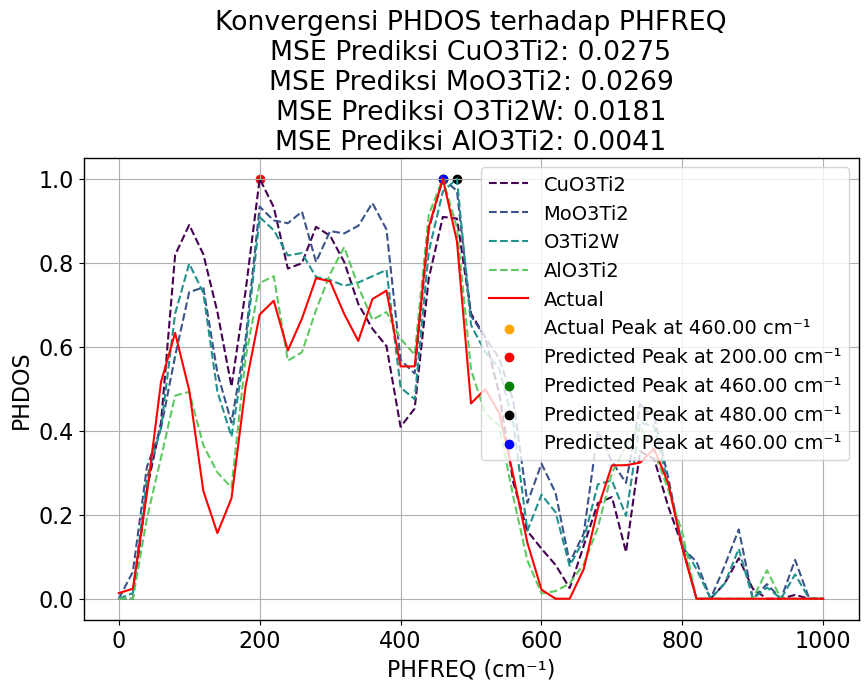

In [34]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error

# Definisi data
data_indices = [1535, 1536, 1537, 1534]

# Mengumpulkan data aktual dan prediksi
data = []
for i in data_indices:
    data.append({
        'phdos_data': df.phdos[i],
        'phfreq_data': df.phfreq[i],
        'phdos_pred': df.phdos_pred[i],
        'phfreq_pred': df.phfreq[i],
        'formula': df.formula[i]
    })

# Menghitung dan mengumpulkan nilai MSE
mses = []
for d in data:
    mses.append(mean_squared_error(d['phdos_data'], d['phdos_pred']))

# Plot data aktual dan prediksi
plt.figure(figsize=(10, 6))
for i, d in enumerate(data):
    plt.plot(d['phfreq_pred'], d['phdos_pred'], label=f'{d["formula"]}', linestyle='--', color=plt.cm.viridis(i / len(data)))

# Plot data aktual hanya sekali
plt.plot(data[0]['phfreq_data'], data[0]['phdos_data'], label='Actual', linestyle='-', color='red')

# Tandai titik puncak pada grafik data aktual hanya sekali
peak_index = np.argmax(data[0]['phdos_data'])
peak_frequency = data[0]['phfreq_data'][peak_index]
plt.scatter(peak_frequency, data[0]['phdos_data'][peak_index], c='orange', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Tandai titik puncak pada grafik data prediksi
for i, d in enumerate(data):
    peak_index_pred = np.argmax(d['phdos_pred'])
    peak_frequency_pred = d['phfreq_pred'][peak_index_pred]
    if i == 0:
        plt.scatter(peak_frequency_pred, d['phdos_pred'][peak_index_pred], c='red', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')
    elif i == 1:
        plt.scatter(peak_frequency_pred, d['phdos_pred'][peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')
    elif i == 2:
        plt.scatter(peak_frequency_pred, d['phdos_pred'][peak_index_pred], c='black', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')
    else:
        plt.scatter(peak_frequency_pred, d['phdos_pred'][peak_index_pred], c='blue', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\n' + '\n'.join([f'MSE Prediksi {data[i]["formula"]}: {mses[i]:.4f}' for i in range(len(data))]))
plt.legend()
plt.grid(True)
plt.show()

In [35]:
import plotly.graph_objects as go
import numpy as np
from sklearn.metrics import mean_squared_error

# Definisi data
data_indices = [1535, 1536, 1537, 1534]

# Mengumpulkan data aktual dan prediksi
data = []
for i in data_indices:
    data.append({
        'phdos_data': df.phdos[i],
        'phfreq_data': df.phfreq[i],
        'phdos_pred': df.phdos_pred[i],
        'phfreq_pred': df.phfreq[i],
        'formula': df.formula[i]
    })

# Menghitung dan mengumpulkan nilai MSE
mses = []
for d in data:
    mses.append(mean_squared_error(d['phdos_data'], d['phdos_pred']))

# Membuat plot
fig = go.Figure()

# Plot PHDOS dan Frequensi
for i, d in enumerate(data):
    fig.add_trace(go.Scatter(x=d['phfreq_data'], y=d['phdos_data'], mode='lines', name=f'{d["formula"]} - Actual', line=dict(color=f'rgb({int(255*i/len(data))}, 100, 100)')))
    fig.add_trace(go.Scatter(x=d['phfreq_pred'], y=d['phdos_pred'], mode='lines', name=f'{d["formula"]} - Predicted', line=dict(color=f'rgb(100, {int(255*i/len(data))}, 100)')))

# Tambahkan marker untuk titik puncak pada grafik data aktual
for i, d in enumerate(data):
    peak_index = np.argmax(d['phdos_data'])
    peak_frequency = d['phfreq_data'][peak_index]
    fig.add_trace(go.Scatter(x=[peak_frequency], y=[d['phdos_data'][peak_index]], mode='markers', name=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9', marker=dict(color='red', size=10)))

# Tambahkan marker untuk titik puncak pada grafik data prediksi
for i, d in enumerate(data):
    peak_index_pred = np.argmax(d['phdos_pred'])
    peak_frequency_pred = d['phfreq_pred'][peak_index_pred]
    fig.add_trace(go.Scatter(x=[peak_frequency_pred], y=[d['phdos_pred'][peak_index_pred]], mode='markers', name=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9', marker=dict(color='blue', size=10)))

# Tambahkan bar chart untuk benchmark (MSE)
fig.add_trace(go.Bar(x=[d['formula'] for d in data], y=mses, name='MSE', marker=dict(color='skyblue')))

# Atur layout dengan tema gelap (dark mode)
fig.update_layout(title='PHDOS dan Frequensi serta Benchmark (MSE) untuk Berbagai Formula',
                  xaxis_title='PHFREQ (cm\u207B\u00B9)',
                  yaxis_title='PHDOS / MSE',
                  barmode='group',
                  template='presentation')
fig.show()


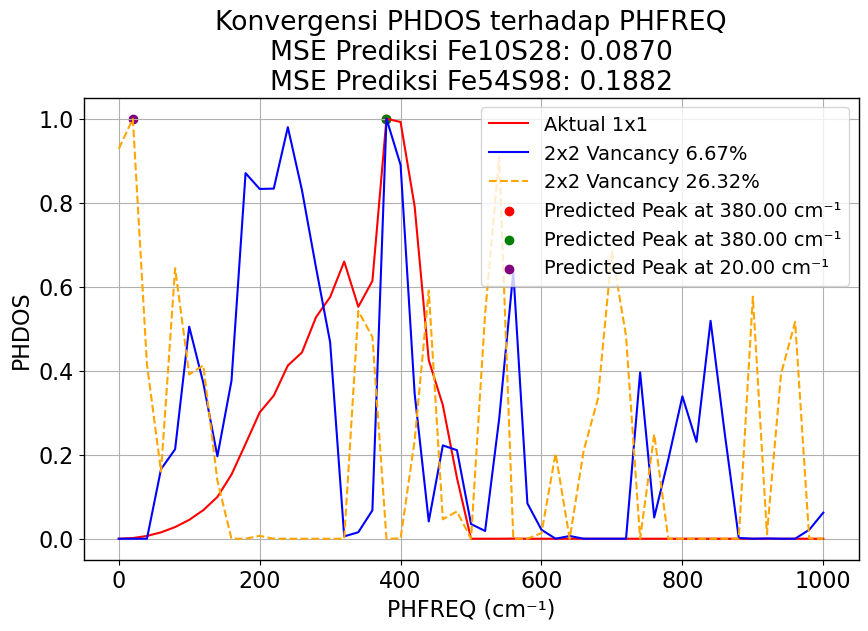

In [36]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]
# Data Prediksi
phdos_pred_data1 = df.phdos_pred[1531]
phfreq_pred_data1 = df.phfreq[1531]
# Data prediksi 
phdos_pred_data2 = df.phdos_pred[1532]
phfreq_pred_data2 = df.phfreq[1532]
formula = df.formula[1531]
formulaa = df.formula[1532]

# Menghitung MSE antara data aktual dan prediksi
mse1 = mean_squared_error(phdos_data, phdos_pred_data1)
mse2 = mean_squared_error(phdos_data, phdos_pred_data2)

# Plot data aktual
plt.figure(figsize=(10, 6))

plt.plot(phfreq_data, phdos_data, label=f'Aktual 1x1', linestyle='-', color='red')

plt.plot(phfreq_pred_data1, phdos_pred_data1, label=f'2x2 Vancancy 6.67%', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data2, phdos_pred_data2, label='2x2 Vancancy 26.32%', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Predicted Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred1 = np.argmax(phdos_pred_data1)
peak_frequency_pred1 = phfreq_pred_data[peak_index_pred1]

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred2 = np.argmax(phdos_pred_data2)
peak_frequency_pred2 = phfreq_pred_data[peak_index_pred2]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred1, phdos_pred_data1[peak_index_pred1], c='green', label=f'Predicted Peak at {peak_frequency_pred1:.2f} cm\u207B\u00B9')

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred2, phdos_pred_data2[peak_index_pred2], c='purple', label=f'Predicted Peak at {peak_frequency_pred2:.2f} cm\u207B\u00B9')

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE Prediksi {formula}: {mse1:.4f}\nMSE Prediksi {formulaa}: {mse2:.4f}')
plt.legend()
plt.grid(True)
plt.show()


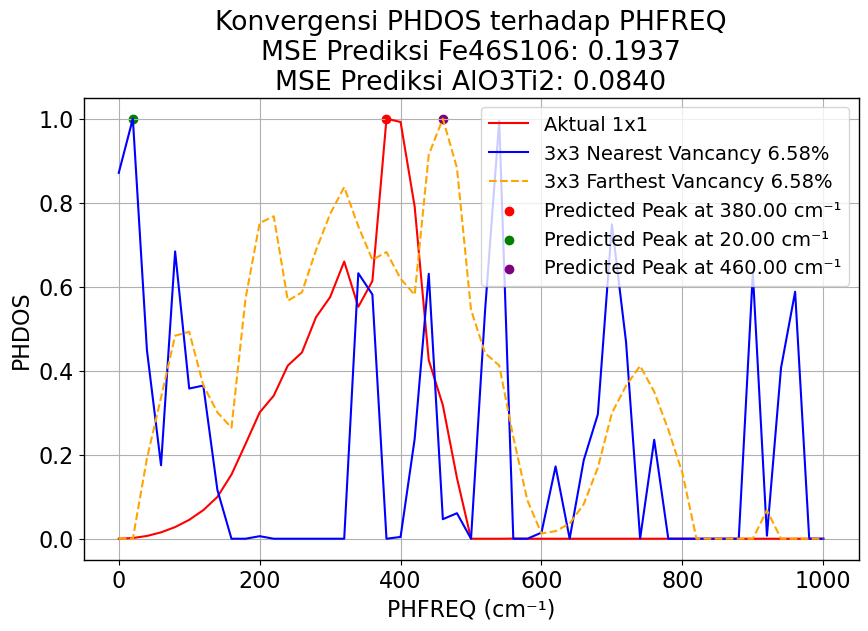

In [37]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]
# Data Prediksi
phdos_pred_data1 = df.phdos_pred[1533]
phfreq_pred_data1 = df.phfreq[1533]
# Data prediksi 
phdos_pred_data2 = df.phdos_pred[1534]
phfreq_pred_data2 = df.phfreq[1534]
formula = df.formula[1533]
formulaa = df.formula[1534]

# Menghitung MSE antara data aktual dan prediksi
mse1 = mean_squared_error(phdos_data, phdos_pred_data1)
mse2 = mean_squared_error(phdos_data, phdos_pred_data2)

# Plot data aktual
plt.figure(figsize=(10, 6))

plt.plot(phfreq_data, phdos_data, label=f'Aktual 1x1', linestyle='-', color='red')

plt.plot(phfreq_pred_data1, phdos_pred_data1, label=f'3x3 Nearest Vancancy 6.58%', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data2, phdos_pred_data2, label='3x3 Farthest Vancancy 6.58%', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Predicted Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred1 = np.argmax(phdos_pred_data1)
peak_frequency_pred1 = phfreq_pred_data[peak_index_pred1]

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred2 = np.argmax(phdos_pred_data2)
peak_frequency_pred2 = phfreq_pred_data[peak_index_pred2]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred1, phdos_pred_data1[peak_index_pred1], c='green', label=f'Predicted Peak at {peak_frequency_pred1:.2f} cm\u207B\u00B9')

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred2, phdos_pred_data2[peak_index_pred2], c='purple', label=f'Predicted Peak at {peak_frequency_pred2:.2f} cm\u207B\u00B9')

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE Prediksi {formula}: {mse1:.4f}\nMSE Prediksi {formulaa}: {mse2:.4f}')
plt.legend()
plt.grid(True)
plt.show()


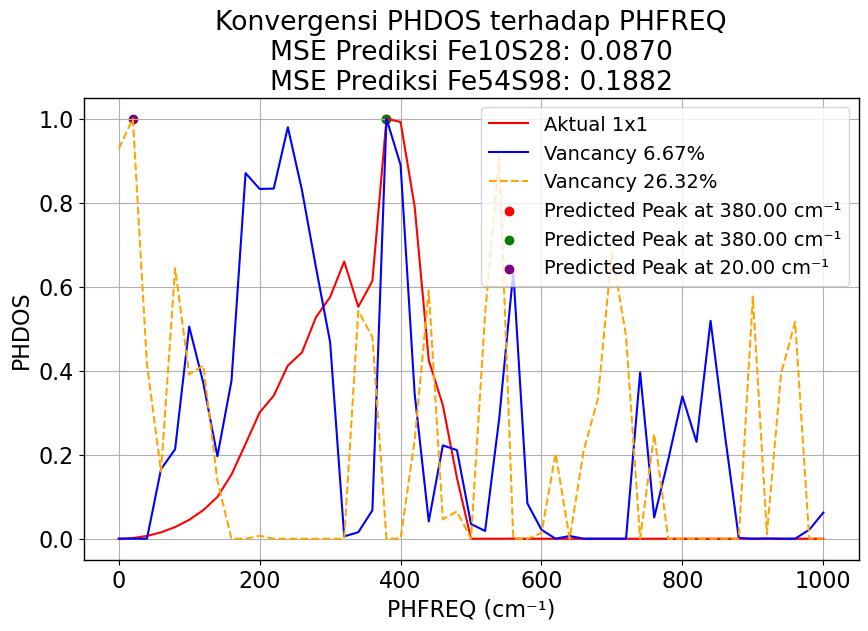

In [38]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]

# Data Prediksi pertama
phdos_pred_data1 = df.phdos_pred[1531]
phfreq_pred_data1 = df.phfreq[1531]

# Data prediksi kedua
phdos_pred_data2 = df.phdos_pred[1532]
phfreq_pred_data2 = df.phfreq[1532]

formula = df.formula[1531]
formulaa = df.formula[1532]

# Menghitung MSE antara data aktual dan prediksi pertama
mse1 = mean_squared_error(phdos_data, phdos_pred_data1)

# Menghitung MSE antara data aktual dan prediksi kedua
mse2 = mean_squared_error(phdos_data, phdos_pred_data2)

# Plot data aktual
plt.figure(figsize=(10, 6))

plt.plot(phfreq_data, phdos_data, label=f'Aktual 1x1', linestyle='-', color='red')

# Plot data prediksi pertama
plt.plot(phfreq_pred_data1, phdos_pred_data1, label=f'Vancancy 6.67%', linestyle='-', color='blue')

# Plot data prediksi kedua
plt.plot(phfreq_pred_data2, phdos_pred_data2, label='Vancancy 26.32%', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Predicted Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi pertama
peak_index_pred1 = np.argmax(phdos_pred_data1)
peak_frequency_pred1 = phfreq_pred_data1[peak_index_pred1]

# Tandai titik puncak pada grafik data prediksi pertama
plt.scatter(peak_frequency_pred1, phdos_pred_data1[peak_index_pred1], c='green', label=f'Predicted Peak at {peak_frequency_pred1:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi kedua
peak_index_pred2 = np.argmax(phdos_pred_data2)
peak_frequency_pred2 = phfreq_pred_data2[peak_index_pred2]

# Tandai titik puncak pada grafik data prediksi kedua
plt.scatter(peak_frequency_pred2, phdos_pred_data2[peak_index_pred2], c='purple', label=f'Predicted Peak at {peak_frequency_pred2:.2f} cm\u207B\u00B9')

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE Prediksi {formula}: {mse1:.4f}\nMSE Prediksi {formulaa}: {mse2:.4f}')

plt.legend()
plt.grid(True)
plt.show()


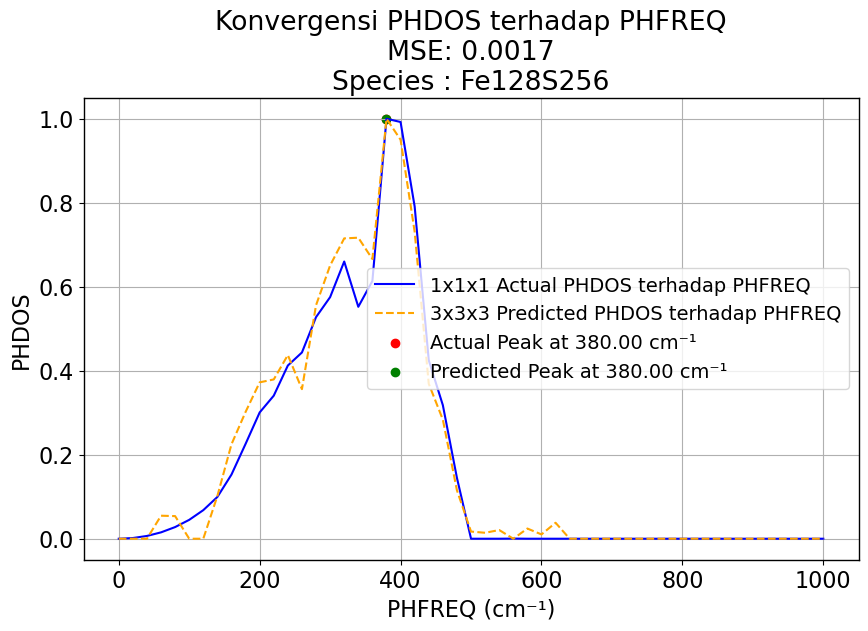

In [39]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1529]
phfreq_pred_data = df.phfreq[1529]
formula = df.formula[1529]

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label=f'1x1x1 Actual PHDOS terhadap PHFREQ', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label='3x3x3 Predicted PHDOS terhadap PHFREQ', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')


plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}'f'\nSpecies : {formula}')
plt.legend()
plt.grid(True)
plt.show()


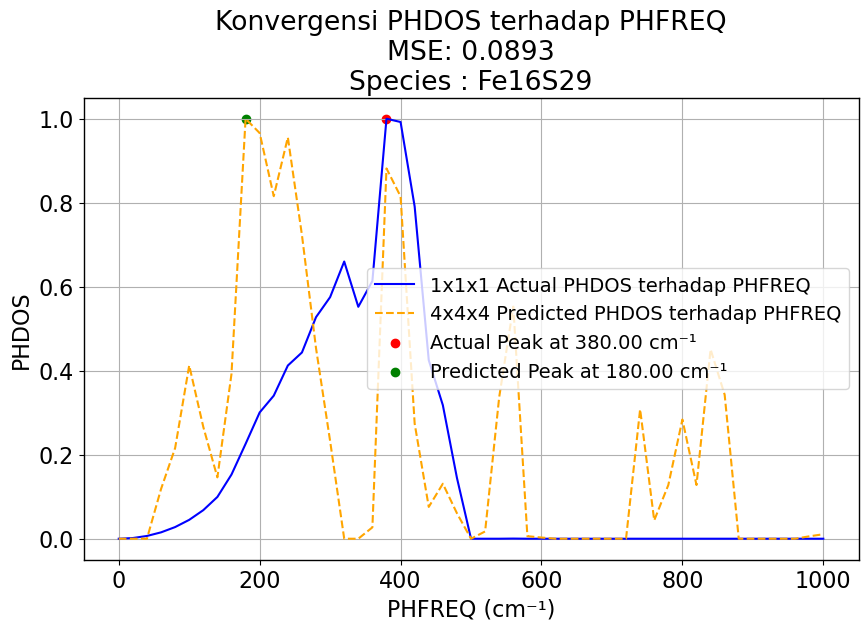

In [40]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1530]
phfreq_pred_data = df.phfreq[1530]
formula = df.formula[1530]

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label=f'1x1x1 Actual PHDOS terhadap PHFREQ', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label='4x4x4 Predicted PHDOS terhadap PHFREQ', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')


plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}'f'\nSpecies : {formula}')
plt.legend()
plt.grid(True)
plt.show()


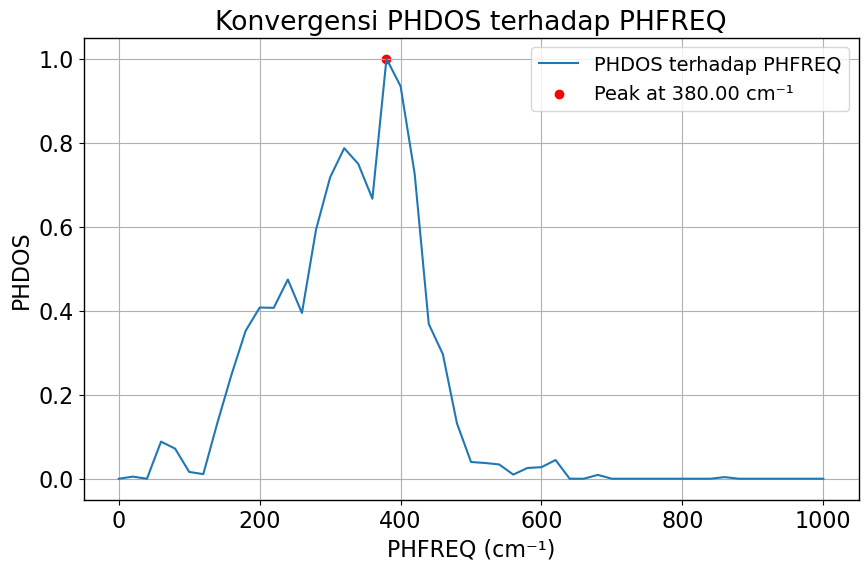

In [41]:
import matplotlib.pyplot as plt
import numpy as np

phdos_data = df.phdos_pred[1523]
phfreq_data = df.phfreq[1523]

# Plot data
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label='PHDOS terhadap PHFREQ')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Peak at {peak_frequency:.2f} cm\u207B\u00B9')
plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title('Konvergensi PHDOS terhadap PHFREQ')
plt.legend()
plt.grid(True)
plt.show()


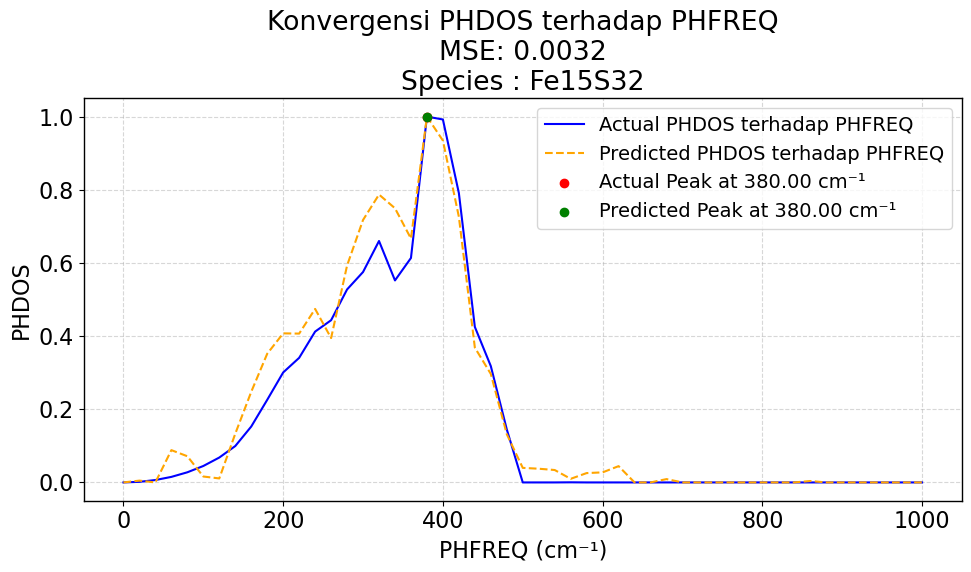

In [42]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1523]
phfreq_pred_data = df.phfreq[1523]
formula = df.formula[1523]

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label=f'Actual PHDOS terhadap PHFREQ', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label='Predicted PHDOS terhadap PHFREQ', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9', zorder=5)

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9', zorder=5)

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}'f'\nSpecies : {formula}')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()  # Mengatur layout agar rapi
plt.show()


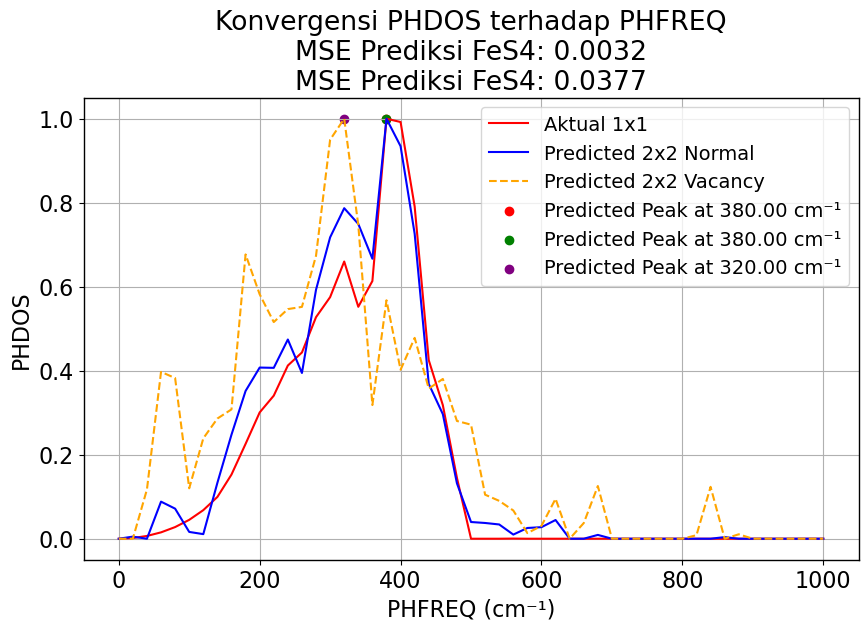

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos[222]
phfreq_data = df.phfreq[222]

# Data Prediksi pertama
phdos_pred_data1 = df.phdos_pred[1523]
phfreq_pred_data1 = df.phfreq[1523]

# Data prediksi kedua
phdos_pred_data2 = df.phdos_pred[1524]
phfreq_pred_data2 = df.phfreq[1524]

formula = df.formula[1524]
formulaa = df.formula[1524]

# Menghitung MSE antara data aktual dan prediksi pertama
mse1 = mean_squared_error(phdos_data, phdos_pred_data1)

# Menghitung MSE antara data aktual dan prediksi kedua
mse2 = mean_squared_error(phdos_data, phdos_pred_data2)

# Plot data aktual
plt.figure(figsize=(10, 6))

plt.plot(phfreq_data, phdos_data, label=f'Aktual 1x1', linestyle='-', color='red')

# Plot data prediksi pertama
plt.plot(phfreq_pred_data1, phdos_pred_data1, label=f'Predicted 2x2 Normal', linestyle='-', color='blue')

# Plot data prediksi kedua
plt.plot(phfreq_pred_data2, phdos_pred_data2, label='Predicted 2x2 Vacancy', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Predicted Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi pertama
peak_index_pred1 = np.argmax(phdos_pred_data1)
peak_frequency_pred1 = phfreq_pred_data1[peak_index_pred1]

# Tandai titik puncak pada grafik data prediksi pertama
plt.scatter(peak_frequency_pred1, phdos_pred_data1[peak_index_pred1], c='green', label=f'Predicted Peak at {peak_frequency_pred1:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi kedua
peak_index_pred2 = np.argmax(phdos_pred_data2)
peak_frequency_pred2 = phfreq_pred_data2[peak_index_pred2]

# Tandai titik puncak pada grafik data prediksi kedua
plt.scatter(peak_frequency_pred2, phdos_pred_data2[peak_index_pred2], c='purple', label=f'Predicted Peak at {peak_frequency_pred2:.2f} cm\u207B\u00B9')

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE Prediksi {formula}: {mse1:.4f}\nMSE Prediksi {formulaa}: {mse2:.4f}')

plt.legend()
plt.grid(True)
plt.show()


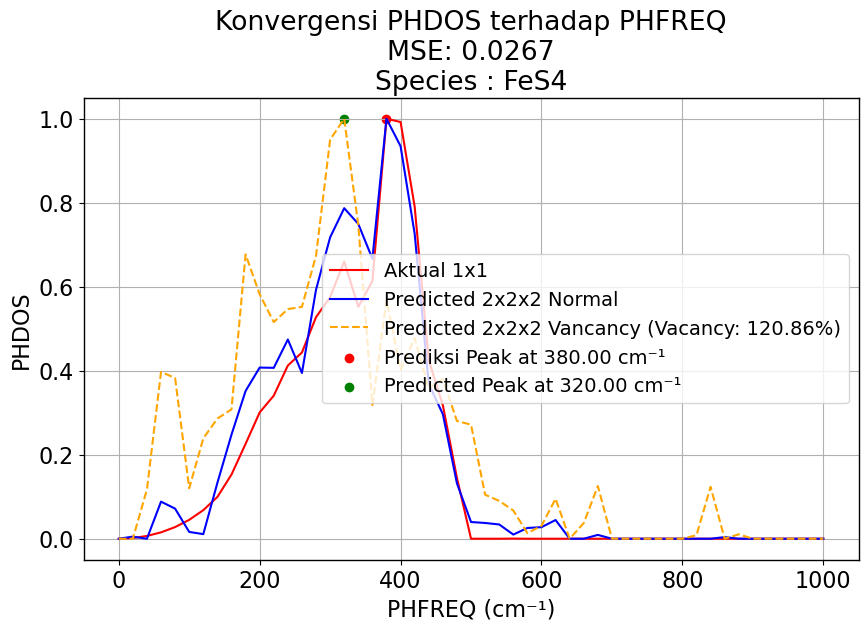

In [44]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos_pred[1523]
phfreq_data = df.phfreq[1523]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1524]
phfreq_pred_data = df.phfreq[1524]
formula = df.formula[1524]

# Data aktual (phdos_data dan phfreq_data)
phdos_dataa = df.phdos[222]
phfreq_dataa = df.phfreq[222]

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Menghitung presentase vacancy
presentase_vacancy = (np.sum(phdos_pred_data) / np.sum(phdos_data)) * 100

# Plot data aktual
plt.figure(figsize=(10, 6))

plt.plot(phfreq_dataa, phdos_dataa, label=f'Aktual 1x1', linestyle='-', color='red')

plt.plot(phfreq_data, phdos_data, label=f'Predicted 2x2x2 Normal', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label=f'Predicted 2x2x2 Vancancy (Vacancy: {presentase_vacancy:.2f}%)', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Prediksi Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')


plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}'f'\nSpecies : {formula}')
plt.legend()
plt.grid(True)
plt.show()


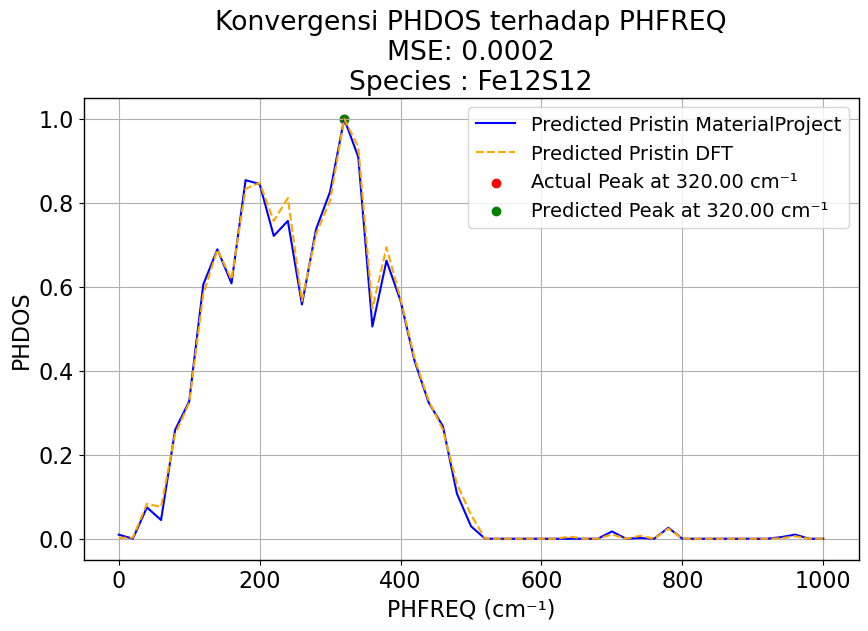

In [45]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos_pred[1526]
phfreq_data = df.phfreq[1526]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1527]
phfreq_pred_data = df.phfreq[1527]
formula = df.formula[1526]

# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label=f'Predicted Pristin MaterialProject', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label='Predicted Pristin DFT', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')


plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}'f'\nSpecies : {formula}')
plt.legend()
plt.grid(True)
plt.show()


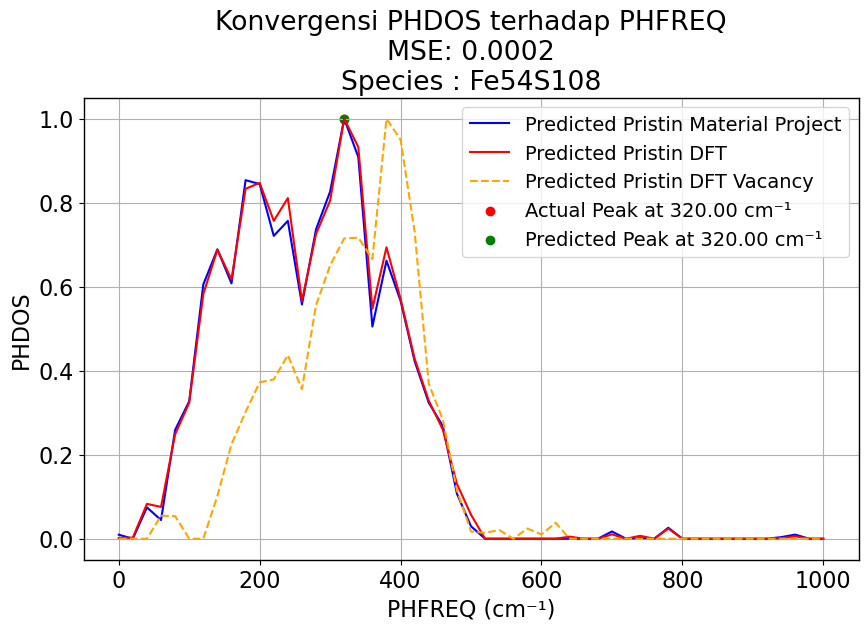

In [46]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos_pred[1526]
phfreq_data = df.phfreq[1526]
# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_data = df.phdos_pred[1527]
phfreq_pred_data = df.phfreq[1527]

# Data prediksi (ganti dengan data prediksi Anda)
phdos_pred_dataa = df.phdos_pred[1528]
phfreq_pred_dataa = df.phfreq[1528]
formula = df.formula[1528]
# Menghitung MSE antara data aktual dan prediksi
mse = mean_squared_error(phdos_data, phdos_pred_data)

# Plot data aktual
plt.figure(figsize=(10, 6))
plt.plot(phfreq_data, phdos_data, label=f'Predicted Pristin Material Project', linestyle='-', color='blue')

# Plot data prediksi
plt.plot(phfreq_pred_data, phdos_pred_data, label='Predicted Pristin DFT', linestyle='-', color='red')

# Plot data prediksi
plt.plot(phfreq_pred_dataa, phdos_pred_dataa, label='Predicted Pristin DFT Vacancy', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Actual Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi
peak_index_pred = np.argmax(phdos_pred_data)
peak_frequency_pred = phfreq_pred_data[peak_index_pred]

# Tandai titik puncak pada grafik data prediksi
plt.scatter(peak_frequency_pred, phdos_pred_data[peak_index_pred], c='green', label=f'Predicted Peak at {peak_frequency_pred:.2f} cm\u207B\u00B9')


plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE: {mse:.4f}'f'\nSpecies : {formula}')
plt.legend()
plt.grid(True)
plt.show()


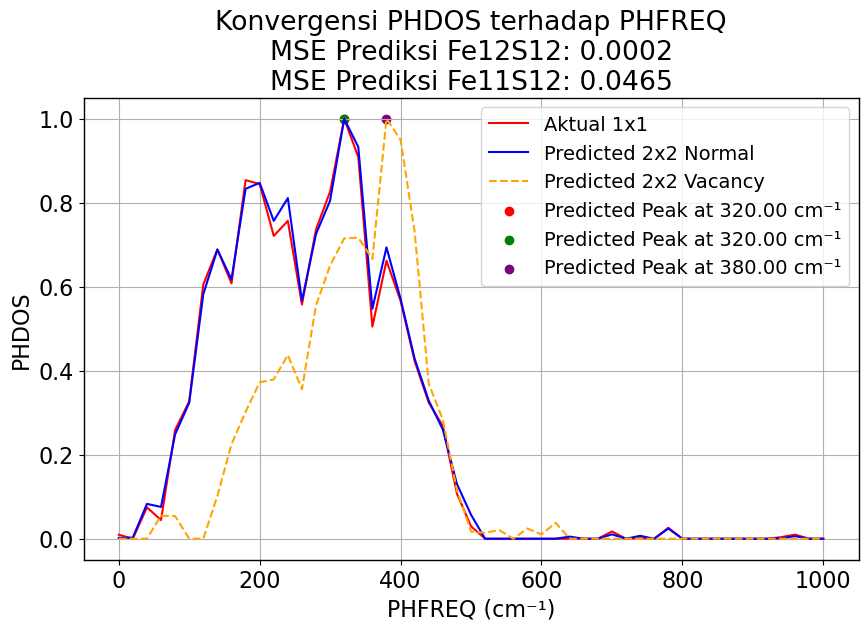

In [47]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from chempy import Substance

# Data aktual (phdos_data dan phfreq_data)
phdos_data = df.phdos_pred[1526]
phfreq_data = df.phfreq[1526]

# Data Prediksi pertama
phdos_pred_data1 = df.phdos_pred[1527]
phfreq_pred_data1 = df.phfreq[1527]

# Data prediksi kedua
phdos_pred_data2 = df.phdos_pred[1528]
phfreq_pred_data2 = df.phfreq[1528]

formula = df.formula[1526]
formulaa = df.formula[1527]

# Menghitung MSE antara data aktual dan prediksi pertama
mse1 = mean_squared_error(phdos_data, phdos_pred_data1)

# Menghitung MSE antara data aktual dan prediksi kedua
mse2 = mean_squared_error(phdos_data, phdos_pred_data2)

# Plot data aktual
plt.figure(figsize=(10, 6))

plt.plot(phfreq_data, phdos_data, label=f'Aktual 1x1', linestyle='-', color='red')

# Plot data prediksi pertama
plt.plot(phfreq_pred_data1, phdos_pred_data1, label=f'Predicted 2x2 Normal', linestyle='-', color='blue')

# Plot data prediksi kedua
plt.plot(phfreq_pred_data2, phdos_pred_data2, label='Predicted 2x2 Vacancy', linestyle='--', color='orange')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS
peak_index = np.argmax(phdos_data)
peak_frequency = phfreq_data[peak_index]

# Tandai titik puncak pada grafik data aktual
plt.scatter(peak_frequency, phdos_data[peak_index], c='red', label=f'Predicted Peak at {peak_frequency:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi pertama
peak_index_pred1 = np.argmax(phdos_pred_data1)
peak_frequency_pred1 = phfreq_pred_data1[peak_index_pred1]

# Tandai titik puncak pada grafik data prediksi pertama
plt.scatter(peak_frequency_pred1, phdos_pred_data1[peak_index_pred1], c='green', label=f'Predicted Peak at {peak_frequency_pred1:.2f} cm\u207B\u00B9')

# Temukan indeks (frekuensi) di mana terdapat puncak PHDOS prediksi kedua
peak_index_pred2 = np.argmax(phdos_pred_data2)
peak_frequency_pred2 = phfreq_pred_data2[peak_index_pred2]

# Tandai titik puncak pada grafik data prediksi kedua
plt.scatter(peak_frequency_pred2, phdos_pred_data2[peak_index_pred2], c='purple', label=f'Predicted Peak at {peak_frequency_pred2:.2f} cm\u207B\u00B9')

plt.xlabel('PHFREQ (cm\u207B\u00B9)')
plt.ylabel('PHDOS')
plt.title(f'Konvergensi PHDOS terhadap PHFREQ\nMSE Prediksi {formula}: {mse1:.4f}\nMSE Prediksi {formulaa}: {mse2:.4f}')

plt.legend()
plt.grid(True)
plt.show()


MSE: 0.000705696766482909
Species : Fe2S4


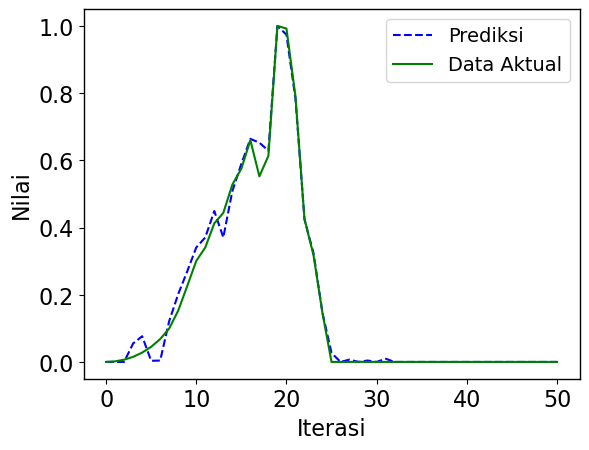

In [48]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import numpy as np

# Misalnya, df adalah DataFrame yang berisi hasil prediksi dan data aktual
# df.phdos_pred[222] adalah hasil prediksi dan df.phdos[222] adalah data aktual

# Ambil hasil prediksi dan data aktual
prediksi = df.phdos_pred[222]
aktual = df.phdos[222]
formula = df.formula[222]

# Hitung Mean Squared Error (MSE)
mse = mean_squared_error(aktual, prediksi)
print(f'MSE: {mse}'f'\nSpecies : {formula}' )

# Plot garis prediksi
plt.plot(prediksi, label='Prediksi', linestyle='--', color='blue')

# Plot garis data aktual
plt.plot(aktual, label='Data Aktual', linestyle='-', color='green')

# Tentukan label sumbu x dan y
plt.xlabel('Iterasi')
plt.ylabel('Nilai')

# Tambahkan legenda
plt.legend()

# Tampilkan plot
plt.show()


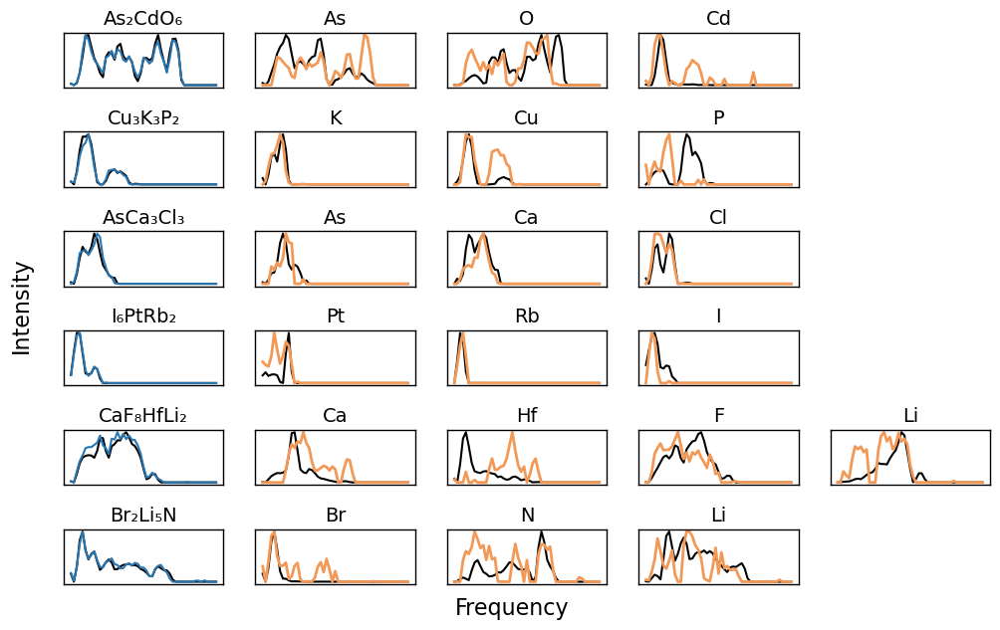

In [49]:
# compare to partial DoS
model.load_state_dict(torch.load(run_name + '.torch', map_location=device)['state'])
model.pool = False

# plot example predicted and true partial dos
plot_partials(model, df, idx_train, device=device)


### Alloys
The current framework extends easily to the representation of alloy structures. As an example, we will predict the phonon DoS of the Mg<sub>3</sub>(Bi,Sb)<sub>2</sub> system, incrementally varying the relative fractions of Bi and Sb. Note that both parent compounds, Mg<sub>3</sub>Sb<sub>2</sub> and Mg<sub>3</sub>Bi<sub>2</sub>, are present in our training data. We will check the validity by comparing the predicted and calculated phonon DoS of Mg<sub>3</sub>Bi<sub>1.5</sub>Sb<sub>0.5</sub>.

In [50]:
# load calculated alloy example
df_alloy, _ = load_data('data/data_alloy.csv')
df_alloy.head()

100%|██████████| 1/1 [00:00<00:00, 19691.57it/s]                                


,mp_id,structure,phfreq,phdos,pdos,formula,species
0,NaN,{},"[0.0, 20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 14...","[0.0, 0.37267476543017564, 0.8879380855551154,...",{},Mg3Bi1.5Sb0.5,"['Mg', 'Bi', 'Sb']"


In [51]:
# get indices of parent structures
idx_Mg3Sb2 = df.loc[df['mp_id'] == 'mp-2646'].index.to_numpy()[0]
idx_Mg3Bi2 = df.loc[df['mp_id'] == 'mp-569018'].index.to_numpy()[0]
print(f'index of Mg3Sb2: {idx_Mg3Sb2}', f'\nindex of Mg3Bi2: {idx_Mg3Bi2}')

index of Mg3Sb2: 474 
index of Mg3Bi2: 1520


In [52]:
# interpolate atomic positions and lattice constants
# 2-hot encode the atomic mass, weighted by the fraction of each species
data_alloy = []
x_Bi = np.linspace(0.01, 0.99, 99)

for i, p in tqdm(enumerate(x_Bi), total=len(x_Bi), bar_format=bar_format):
    symbols = df['data'][idx_Mg3Bi2].symbol.copy()
    positions = torch.lerp(df['data'][idx_Mg3Sb2].pos.clone(), df['data'][idx_Mg3Bi2].pos.clone(), p)
    lattice = torch.lerp(df['data'][idx_Mg3Sb2].lattice.clone(), df['data'][idx_Mg3Bi2].lattice.clone(), p)

    # edge_src and edge_dst are the indices of the central and neighboring atom, respectively
    # edge_shift indicates whether the neighbors are in different images or copies of the unit cell
    struct = df.iloc[idx_Mg3Bi2].structure.copy()
    struct.positions = positions.numpy().copy()
    struct.cell = lattice.numpy().squeeze().copy()
    edge_src, edge_dst, edge_shift = neighbor_list("ijS", a=struct, cutoff=r_max, self_interaction=True)
    
    # compute the relative distances and unit cell shifts from periodic boundaries
    edge_batch = positions.new_zeros(positions.shape[0], dtype=torch.long)[torch.from_numpy(edge_src)]
    edge_vec = (positions[torch.from_numpy(edge_dst)]
                - positions[torch.from_numpy(edge_src)]
                + torch.einsum('ni,nij->nj', torch.tensor(edge_shift, dtype=default_dtype), lattice[edge_batch]))

    # compute edge lengths (rounded only for plotting purposes)
    edge_len = np.around(edge_vec.norm(dim=1).numpy(), decimals=2)
    
    data_alloy.append(
            tg.data.Data(
            pos=positions, 
            lattice=lattice, 
            symbol=symbols,
            x=torch.lerp(df['data'][idx_Mg3Sb2].x, df['data'][idx_Mg3Bi2].x, p),
            z=torch.lerp(df['data'][idx_Mg3Sb2].z, df['data'][idx_Mg3Bi2].z, p),
            edge_index=torch.stack([torch.LongTensor(edge_src), torch.LongTensor(edge_dst)], dim=0),
            edge_shift=torch.tensor(edge_shift, dtype=default_dtype),
            edge_vec=edge_vec, edge_len=edge_len,
            phdos=df['data'][idx_Mg3Bi2].phdos.clone()
        )
    )

100%|██████████| 99/99 [00:00<00:00, 226.55it/s]                                


In [53]:
# predict on all alloy structures
model.load_state_dict(torch.load(run_name + '.torch', map_location=device)['state'])
model.pool = True

dataloader = tg.loader.DataLoader([df.iloc[idx_Mg3Sb2]['data']] + data_alloy + [df.iloc[idx_Mg3Bi2]['data']],
                                  batch_size=32)

output = np.zeros((len(data_alloy) + 2, len(df_alloy['phdos'][0])))
model.to(device)
model.eval()
with torch.no_grad():
    i0 = 0
    for i, d in tqdm(enumerate(dataloader), total=len(dataloader), bar_format=bar_format):
        d.to(device)
        output[i0:i0 + len(d.phdos),:] = model(d).cpu().numpy()
        i0 += len(d.phdos)

100%|██████████| 4/4 [00:00<00:00, 18.50it/s]                                   


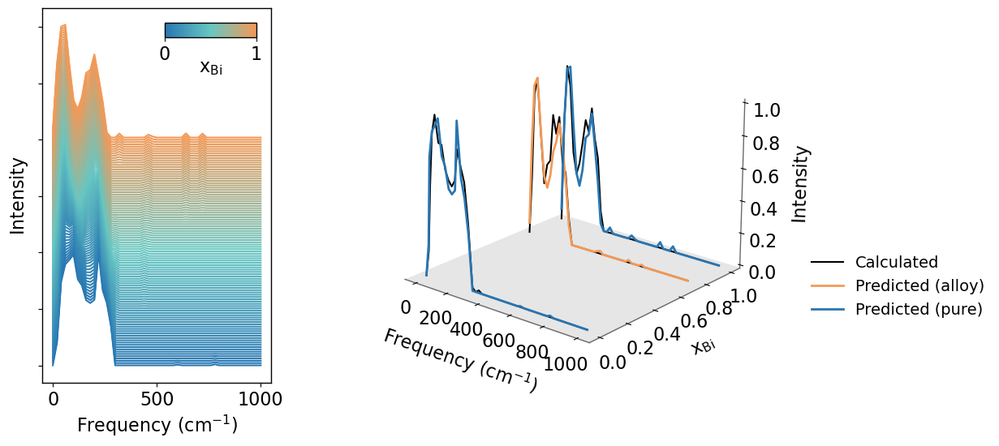

In [54]:
# plot predictions, and compare with calculated result for selected compound
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6), gridspec_kw={'width_ratios': [1,2]})
color = cmap(np.linspace(0, 1, len(output)))
f = df_alloy['phfreq'][0]

# waterfall plot of alloy predictions
s = 2./len(x_Bi)
for i in range(len(output)):
    ax1.plot(f, output[i]/output[i].max() + i*s, c=color[i])
ax1.set_yticklabels([])
ax1.set_xlabel('$Frequency\ (cm^{-1})$')
ax1.set_ylabel('$Intensity$')

sm = mpl.cm.ScalarMappable(cmap=cmap)
sm.set_array([])
cax = inset_axes(ax1, width="40%", height="4%", loc=3, bbox_to_anchor=(0.5,0.9,1,1), bbox_transform=ax1.transAxes) 
cbar = fig.colorbar(sm, cax=cax, aspect=16, orientation='horizontal', pad=-0.1)
cbar.ax.set_xlabel('$x_{Bi}$', fontsize=16, labelpad=-5)
    
# comparison to calculation
p = x_Bi.tolist().index(0.75)
ax2.remove()
ax2 = fig.add_subplot(122, projection='3d')

# plot calculations
ax2.plot(f, [0.75]*len(f), df_alloy['phdos'][0], lw=1.5, c='black', label='Calculated')
ax2.plot(f, [0]*len(f), df.iloc[idx_Mg3Sb2]['phdos'], lw=1.5, c='black')
ax2.plot(f, [1]*len(f), df.iloc[idx_Mg3Bi2]['phdos'], lw=1.5, c='black')

# plot predictions
ax2.plot(f, [0.75]*len(f), output[p]/output[p].max(), lw=2, c=palette[1], label='Predicted (alloy)')
ax2.plot(f, [0]*len(f), output[0]/output[0].max(), lw=2, c=palette[0], label='Predicted (pure)')
ax2.plot(f, [1]*len(f), output[-1]/output[-1].max(), lw=2, c=palette[0])

ax2.view_init(elev=20, azim=-50)
ax2.xaxis.set_pane_color((1., 1., 1., 1.))
ax2.yaxis.set_pane_color((1., 1., 1., 1.))
ax2.zaxis.set_pane_color((0.9, 0.9, 0.9, 1.))
ax2.grid(False)
ax2.xaxis.line.set_color('dimgray'); ax2.yaxis.line.set_color('dimgray'); ax2.zaxis.line.set_color('dimgray')
    
ax2.set_xlabel('$Frequency\ (cm^{-1})$', labelpad=14)
ax2.set_ylabel('$x_{Bi}$', labelpad=10)
ax2.set_zlabel('$Intensity$', labelpad=10)
ax2.legend(frameon=False, bbox_to_anchor=(0.9,0.4), bbox_transform=fig.transFigure);

### Visualization of intermediate features
We can visualize the intermediate features on each node projected onto the basis of spherical harmonics.

In [55]:
d = next(iter(dataloader_train))
specie = d.symbol[0]
sts, st_feats = get_middle_feats(d, model, normalize=True)

for sts_idx in range(len(sts)):
    traces, traces_species = plotly_surface(sts[sts_idx], st_feats[sts_idx].detach().cpu(), centers=d.pos.cpu(),
                                            res=20, radius=True, species=specie)
    fig_html = plot_orbitals(traces, traces_species, title_str=f'feature: {str(sts[sts_idx])}')
    
    with open(f'feature_{str(sts[sts_idx])}.html', 'w') as f:
        f.write(fig_html)

64x0e 1
32x1o 3


#### For Colab only:

In [56]:
from IPython.display import HTML

imgs = [f'feature_{str(sts[sts_idx])}.html' for sts_idx in range(len(sts))]

for img in imgs:
    display(HTML(filename=img))